In [ ]:
# # Please don't rerun this. Time consuming.
# #count the number of lines in csv
# !bash wc -l chicago_camera_tickets.csv
# #11557498
# !bash wc -l chicago_parking_tickets.csv
# #54430547

# #systematically sample every nth line, keeping the first line (header)
# !bash awk 'NR == 1 || NR % 10 == 0' chicago_camera_tickets.csv > camera_sample
# !bash awk 'NR == 1 || NR % 50 == 0' chicago_parking_tickets.csv > parking_sample

In [100]:
import numpy as np
import pandas as pd
import pandas_profiling

In [101]:
# camera = pd.read_csv(r'camera_sample.csv')

# camera.ticket_number = camera.ticket_number.astype(str)
# camera.issue_date = pd.to_datetime(camera.issue_date)
# camera.ticket_queue_date = pd.to_datetime(camera.ticket_queue_date)
# camera.notice_number = camera.notice_number.astype(str)

# camera['zipcode_5_dig'] = camera.zipcode.str[:5]

In [102]:
# pandas_profiling.ProfileReport(camera)

In [3]:
parking = pd.read_csv(r'parking_sample.csv')

parking.ticket_number = parking.ticket_number.astype(str)
parking.issue_date = pd.to_datetime(parking.issue_date)
parking.ticket_queue_date = pd.to_datetime(parking.ticket_queue_date)
parking.notice_number = parking.notice_number.astype(str)
parking.ward = parking.ward.astype(str)
parking.tract_id = parking.tract_id.astype(str)
parking.blockgroup_geoid = parking.blockgroup_geoid.astype(str)
parking.community_area_number = parking.community_area_number.astype(str)

parking['zipcode_5_dig'] = parking.zipcode.str[:5]

C:\Users\K\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning: Columns (6,9,21) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [5]:
pandas_profiling.ProfileReport(parking)

C:\Users\K\Anaconda3\lib\site-packages\pandas_profiling\describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,37
Number of observations,1088610
Total Missing (%),5.3%
Total size in memory,307.3 MiB
Average record size in memory,296.0 B
Numeric,9
Categorical,23
Boolean,0
Date,2
Text (Unique),1
Rejected,1


In [292]:
tues2pm = parking.loc[:,['issue_date', 'license_plate_state', 'license_plate_type',
       'violation_code', 'violation_description', 'current_amount_due', 'total_payments',
       'ticket_queue', 'ticket_queue_date', 'notice_level', 'notice_number',
       'hearing_disposition', 'normalized_address', 'year', 'month',
       'hour', 
       'community_area_name', 'geocoded_lng', 'geocoded_lat', 'zipcode_5_dig']]

In [363]:
tues4pm = parking.set_index('issue_date')

In [215]:
# parking[['ticket_number', 'issue_date', 'violation_location',
#        'license_plate_number', 'license_plate_state', 'license_plate_type',
#        'zipcode', 'violation_code', 'violation_description', 'unit',
#        'unit_description', 'vehicle_make', 'fine_level1_amount',
#        'fine_level2_amount', 'current_amount_due', 'total_payments',
#        'ticket_queue', 'ticket_queue_date', 'notice_level', 'notice_number',
#        'hearing_disposition', 'officer', 'normalized_address', 'year', 'month',
#        'hour', 'ward', 'tract_id', 'blockgroup_geoid', 'community_area_number',
#        'community_area_name', 'geocode_accuracy', 'geocode_accuracy_type',
#        'geocoded_address', 'geocoded_lng', 'geocoded_lat', 'zipcode_5_dig']]

In [246]:
tues2pm.set_index('issue_date').groupby('violation_description').sum()['total_payments'].sort_values(ascending=False).head(60).index

Index(['NO CITY STICKER OR IMPROPER DISPLAY',
       'EXPIRED PLATES OR TEMPORARY REGISTRATION',
       'PARKING/STANDING PROHIBITED ANYTIME', 'RESIDENTIAL PERMIT PARKING',
       'NO CITY STICKER VEHICLE UNDER/EQUAL TO 16,000 LBS.', 'STREET CLEANING',
       'EXP. METER NON-CENTRAL BUSINESS DISTRICT', 'RUSH HOUR PARKING',
       'STREET CLEANING OR SPECIAL EVENT', 'WITHIN 15' OF FIRE HYDRANT',
       'EXPIRED METER CENTRAL BUSINESS DISTRICT',
       'REAR AND FRONT PLATE REQUIRED', 'EXPIRED METER OR OVERSTAY',
       'PARK OR STAND IN BUS/TAXI/CARRIAGE STAND',
       'NO STANDING/PARKING TIME RESTRICTED', 'PARK OR BLOCK ALLEY',
       'DISABLED PARKING ZONE', 'DOUBLE PARKING OR STANDING',
       'RESIDENTIAL PARKING PERMIT ZONE', 'PARK OR STAND ON CROSSWALK',
       'BLOCK ACCESS/ALLEY/DRIVEWAY/FIRELANE',
       'TRUCK,RV,BUS, OR TAXI RESIDENTIAL STREET',
       'SMOKED/TINTED WINDOWS PARKED/STANDING', 'STOP SIGN OR TRAFFIC SIGNAL',
       'OBSTRUCT ROADWAY', 'CURB LOADING ZONE', 'DIS

TypeError: no numeric data to plot

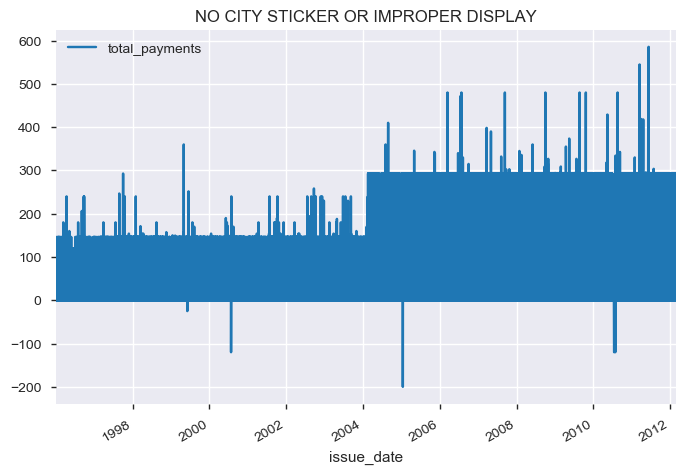

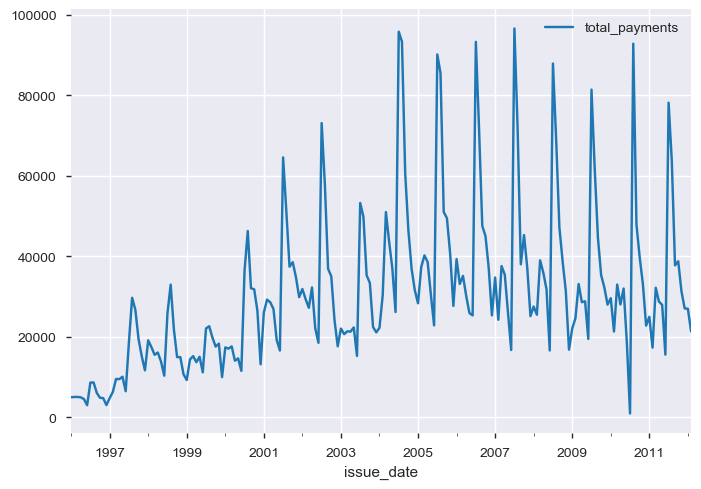

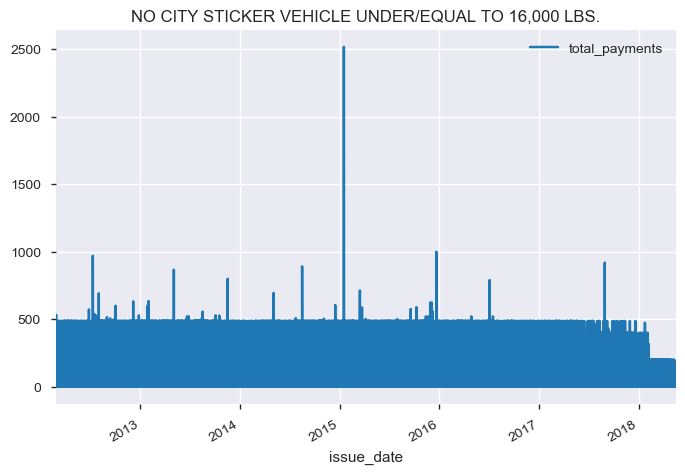

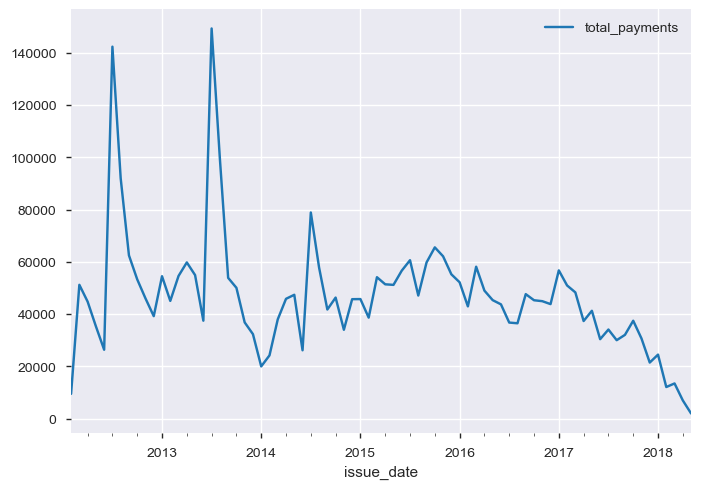

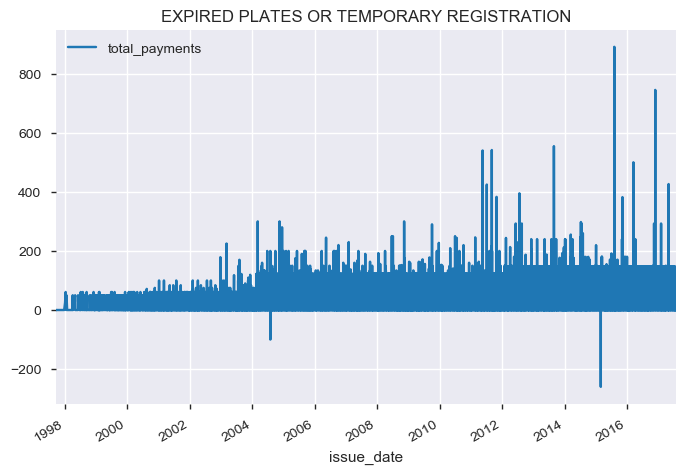

...

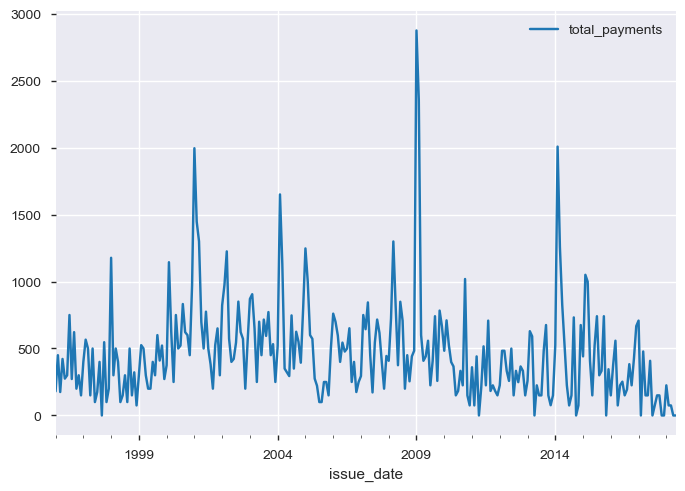

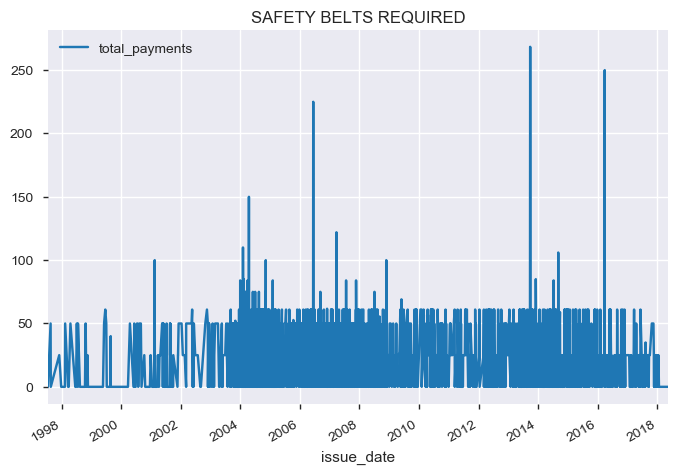

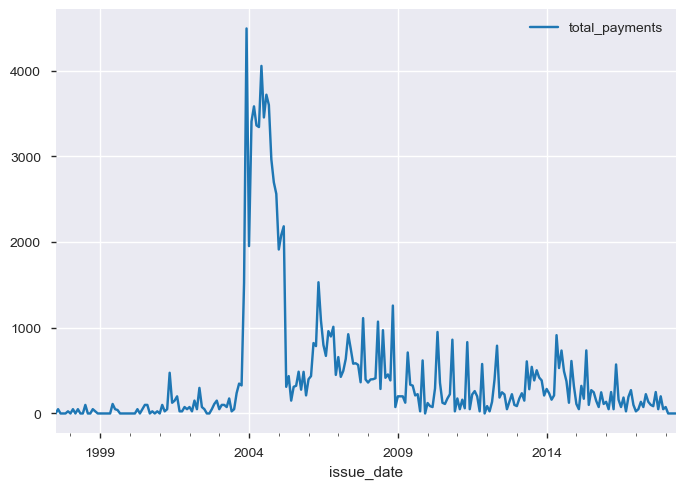

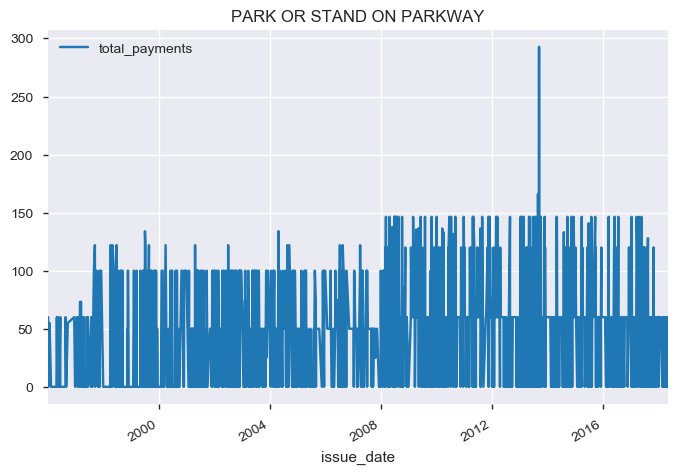

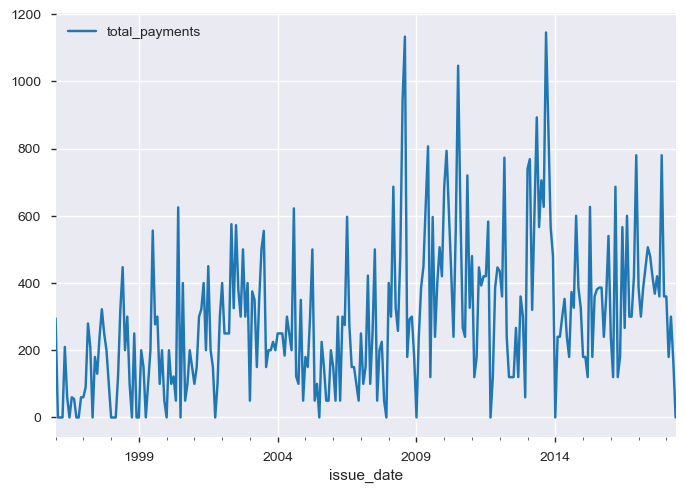

In [365]:
violations = ['NO CITY STICKER OR IMPROPER DISPLAY', 'NO CITY STICKER VEHICLE UNDER/EQUAL TO 16,000 LBS.', 
       'EXPIRED PLATES OR TEMPORARY REGISTRATION', 'EXPIRED PLATE OR TEMPORARY REGISTRATION', 
       'PARKING/STANDING PROHIBITED ANYTIME', 'RESIDENTIAL PERMIT PARKING', 'RESIDENTIAL PARKING PERMIT ZONE', 
       'STREET CLEANING', 'STREET CLEANING OR SPECIAL EVENT', 
       'EXP. METER NON-CENTRAL BUSINESS DISTRICT', 'RUSH HOUR PARKING',
       "WITHIN 15' OF FIRE HYDRANT",
       'EXPIRED METER CENTRAL BUSINESS DISTRICT',
       'REAR AND FRONT PLATE REQUIRED', 'EXPIRED METER OR OVERSTAY',
       'PARK OR STAND IN BUS/TAXI/CARRIAGE STAND',
       'NO STANDING/PARKING TIME RESTRICTED', 
       'DISABLED PARKING', 'DISABLED PARKING ZONE', 'DOUBLE PARKING OR STANDING',
       'PARK OR STAND ON CROSSWALK',
       'BLOCK ACCESS/ALLEY/DRIVEWAY/FIRELANE',
       'TRUCK,RV,BUS, OR TAXI RESIDENTIAL STREET',
       'SMOKED/TINTED WINDOWS PARKED/STANDING', 'STOP SIGN OR TRAFFIC SIGNAL',
       'OBSTRUCT ROADWAY', 'CURB LOADING ZONE', 
       'NONCOMPLIANT PLATE(S)', 'PARK OR STAND ON SIDEWALK', 'PARK OR BLOCK ALLEY', 'PARK ALLEY',
       'STAND, PARK, OR OTHER USE OF BUS LANE', '3-7 AM SNOW ROUTE',
       'DISABLED CURB CUT',
       'IMPOUND-UNLAWFUL DRUGS', 'ABANDONED VEH. FOR 7 DAYS OR INOPERABLE',
       'SAFETY BELTS REQUIRED', 'PARK OR STAND ON PARKWAY',
       'WRONG DIRECTION OR 12'' FROM CURB',
       'PARK OR STAND IN VIADUCT/UNDERPASS',
       'IMPOUND-DRIVING WHILE INTOXICATED', 'PARK/STAND ON BICYCLE PATH',
       'OBSTRUCTED OR IMPROPERLY TINTED WINDOWS', 'SPECIAL EVENTS RESTRICTION',
       "20'OF CROSSWALK", 'MISSING/NONCOMPLIANT FRONT AND/OR REAR PLATE',
       'HAZARDOUS DILAPITATED VEHICLE', 'PARK IN FIRE LANE',
       'WINDOWS MISSING OR CRACKED BEYOND 6 ',
       'PARK VEHICLE SOLE PURPOSE OF DISPLAYING FOR SALE',
       'DISPLAY OF REGISTRATION PLATES', 'IMPOUND-SOLICIT OF PROSTITUTION',
       'TRUCK,MOTOR HOME, BUS BUSINESS STREET', 'IMPOUND-LOUD MUSIC',
       'TRUCK OR SEMI-TRAILER PROHIBITED',
       'REAR PLATE REQUIRED MOTORCYCLE/TRAILER', 'NO PARK IN PRIVATE LOT',
       'FAIL TO PAY OR OUTSIDE SPACE IN CITY LOT', 'OUTSIDE METERED SPACE',
       'NO CITY STICKER VEHICLE OVER 16,000 LBS.']

for violation in violations:
    tues2pm.loc[tues2pm['violation_description'] == violation, ['issue_date', 'total_payments']].set_index('issue_date').plot()
    plt.title(violation)
    tues2pm.loc[tues2pm['violation_description'] == violation, ['issue_date', 'total_payments']].set_index('issue_date').resample('M').sum().plot()


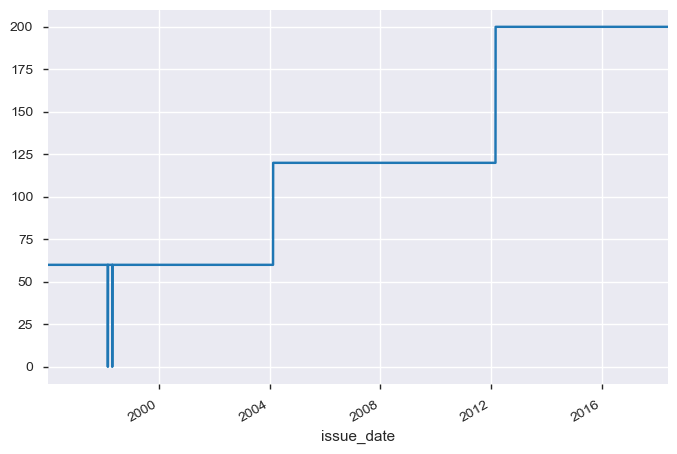

In [368]:
tues4pm[tues4pm['violation_description'].isin(['NO CITY STICKER OR IMPROPER DISPLAY', 'NO CITY STICKER VEHICLE UNDER/EQUAL TO 16,000 LBS.'])]['fine_level1_amount'].plot()

In [369]:
view = tues4pm[tues4pm['violation_description'].isin(['NO CITY STICKER OR IMPROPER DISPLAY', 'NO CITY STICKER VEHICLE UNDER/EQUAL TO 16,000 LBS.'])]

In [374]:
view.sample(60).iloc[:,:10]
# view.loc['fine_level1_amount'] == 

,ticket_number,violation_location,license_plate_number,license_plate_state,license_plate_type,zipcode,violation_code,violation_description,unit,unit_description
issue_date,,,,,,,,,,
2001-04-20 13:54:00,35613463,5115 S TALMAN,f818b0e5d6801aa037f4bf3f89d745772642d9fefa45f1...,IL,PAS,000000000,0964125,NO CITY STICKER OR IMPROPER DISPLAY,498,DOF
2005-08-30 16:37:00,9057786735,1915 N ELSTON,0797988824a1244d94d1a86a77c05317550fe85e6df1a3...,IL,PAS,NaN,0964125,NO CITY STICKER OR IMPROPER DISPLAY,498,DOF
2006-01-09 08:08:00,49087317,11123 S HALE,f783ddc134e987e7386c2188c04f02ad2d6be42711c584...,IL,PAS,606434005,0964125,NO CITY STICKER OR IMPROPER DISPLAY,498,DOF
2006-09-21 09:16:00,9053599015,1321 W 77TH ST,ba29bef5fc3331c3b0decbc7b27893d95f4a3a13a4c85c...,IL,PAS,60620,0964125,NO CITY STICKER OR IMPROPER DISPLAY,498,DOF
2006-10-27 20:03:00,49731545,5927 N BROADWAY,965963318e4d925493e6288c9941cb0878dc22d617b51b...,IL,PAS,60626,0964125,NO CITY STICKER OR IMPROPER DISPLAY,20,CPD
2001-08-09 13:00:00,35974788,2758 23RD ST,8b7c37a6977c0471c247147f6efc23f799cdc19f066f02...,IL,PAS,606320000,0964125,NO CITY STICKER OR IMPROPER DISPLAY,10,CPD
2006-10-28 01:10:00,51026597,821 W EVERGREEN,02e9b6056dc8a56555de19feab9089c2d2c648d8c44a77...,IL,PAS,60616,0964125,NO CITY STICKER OR IMPROPER DISPLAY,18,CPD
2003-06-06 06:49:00,42287420,5325 S JUSTINE,774ad7e38d31a9b32cde9f66eb72838cbd164e6b1d6d57...,IL,PAS,60459,0964125,NO CITY STICKER OR IMPROPER DISPLAY,9,CPD
2000-11-06 08:45:00,34181370,4505 N RAVENSWOOD,71685589ec6efb6b2920eb233e5668dbdefe083ea598a4...,IL,PAS,606132848,0964125,NO CITY STICKER OR IMPROPER DISPLAY,19,CPD


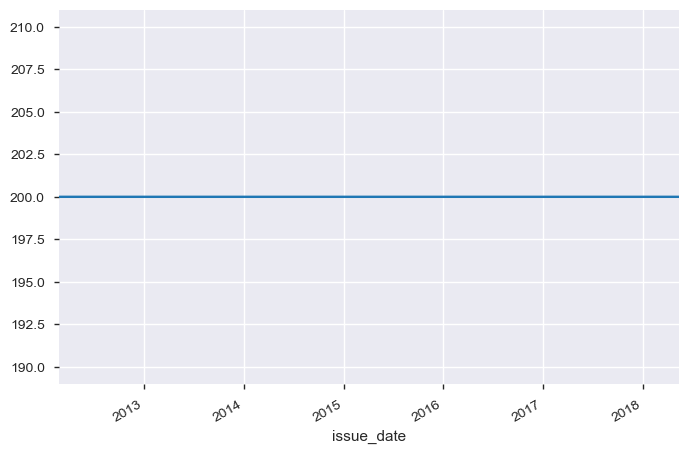

In [394]:
parking[parking['violation_code'] == '0964125B'].set_index('issue_date')['fine_level1_amount'].plot()

In [359]:
parking['paid'] = parking['total_payments'] >= parking['current_amount_due']

In [408]:
len(sorted(parking['violation_code'].unique()))

156

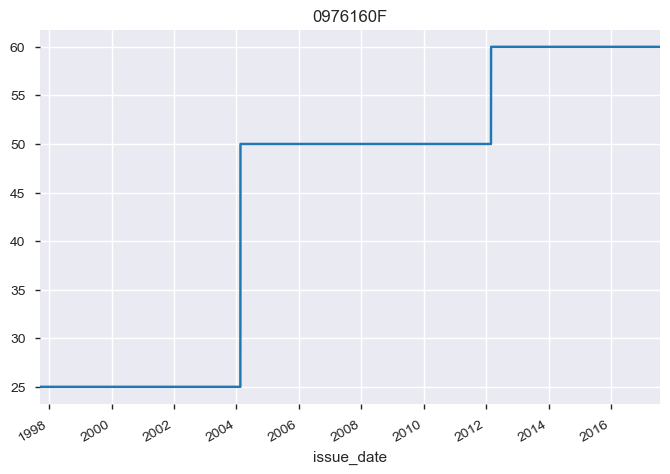

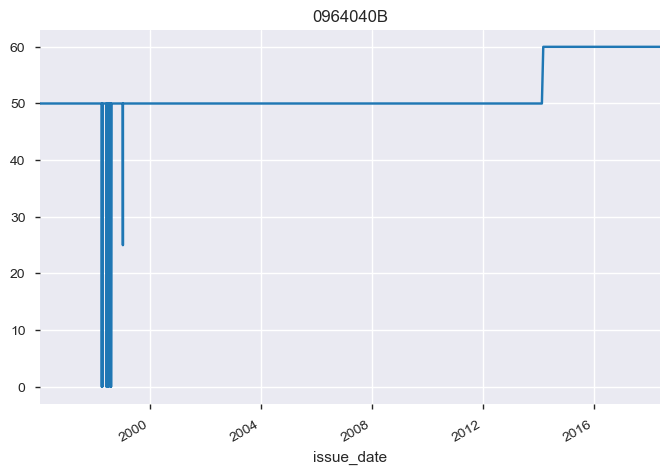

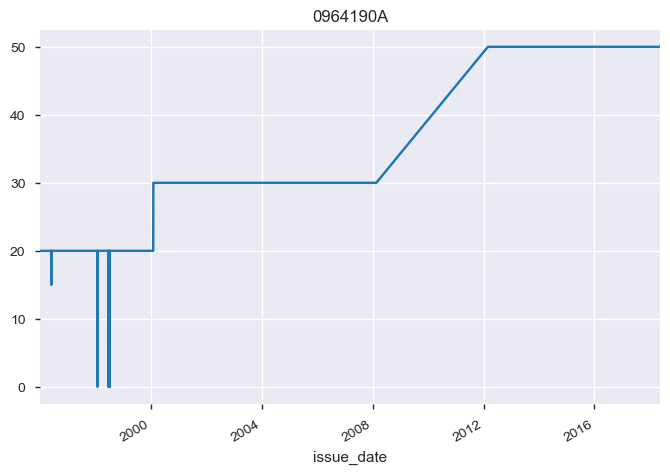

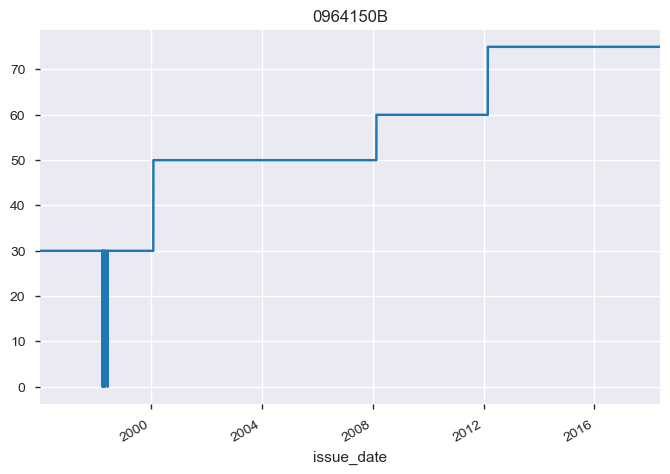

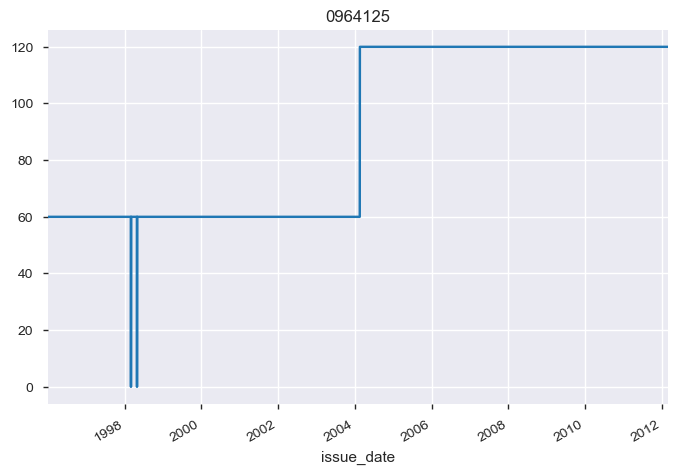

...

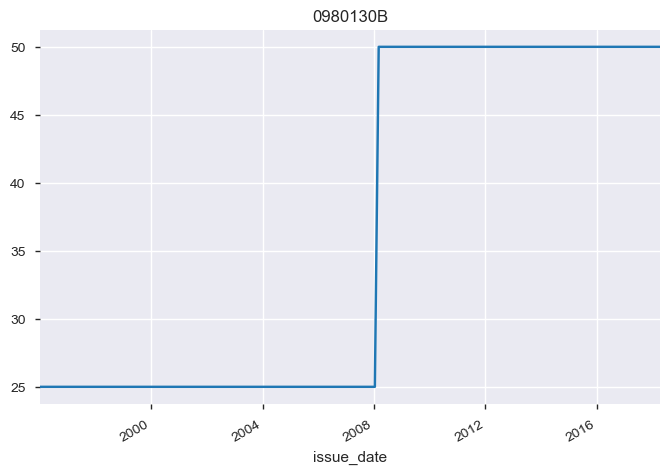

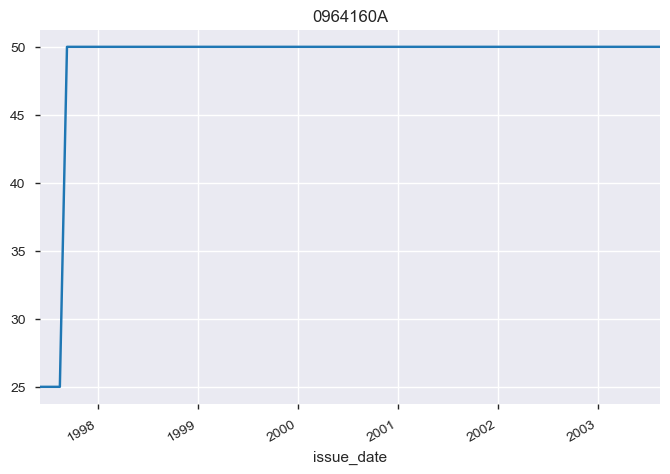

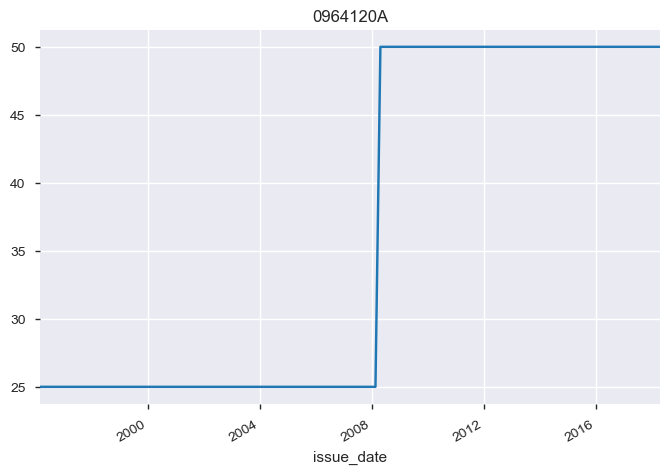

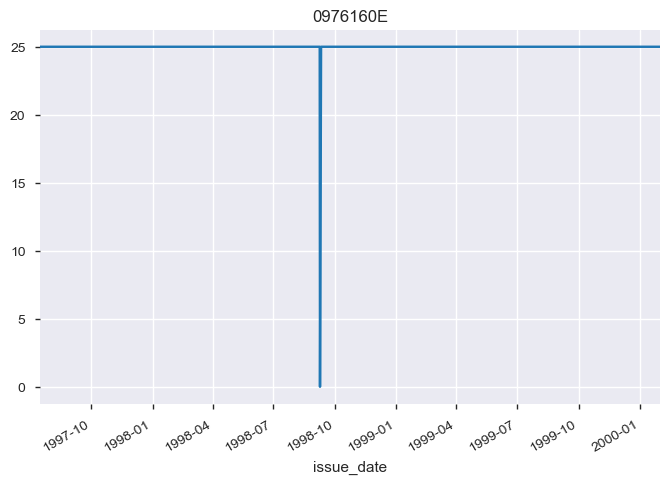

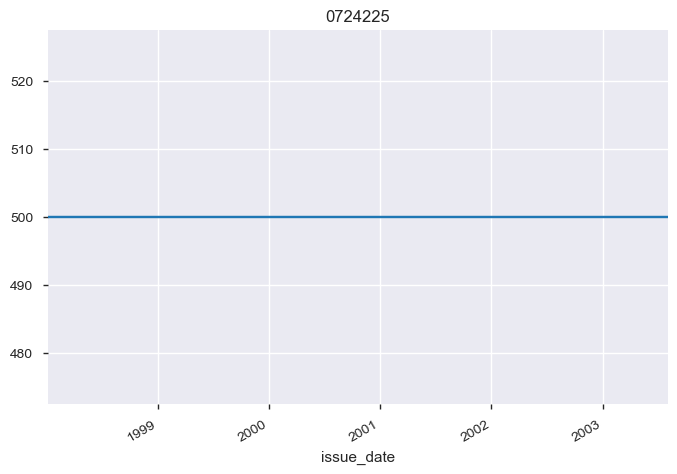

In [418]:
codes = ['0976160F', '0964040B', '0964190A', '0964150B', '0964125', '0964090E',
       '0976160A', '0964080A', '0964190B', '0964190', '0964140B', '0964080B',
       '0964125B', '0964100A', '0964090B', '0964170A', '0964110A', '0964130',
       '0964110C', '0964020B', '0976160B', '0964100G', '0976220B', '0980110A',
       '0964160B', '0976160D', '0964050J', '0964100C', '0964110D', '0964060',
       '0976180A', '0976210B', '0964020A', '0980080A', '0964100D', '0964130A',
       '0980110B', '0912060', '0976160', '0964200B', '0964050I', '0964110E',
       '0964170B', '0980120B', '0964110G', '0964100F', '0976220A', '0980130A',
       '0976050B', '0964100B', '0964125D', '0964180A', '0964070', '0964170D',
       '0964050C', '0980130B', '0964160A', '0964120A', '0976160E', '0724225']
for code in codes:
    parking[parking['violation_code'] == code].set_index('issue_date')['fine_level1_amount'].plot()
    plt.title(code)
    plt.show()

In [464]:
constant = ['0964125B', '0976180A', '0976210B', '0964020A', '0912060', '0980120B', '0976050B', '0964125D', '0964170D']
changing = (['0976160F', '0964040B', '0964190A', '0964150B', '0964090E',
       '0976160A', '0964080A', '0964190B', '0964140B', '0964080B',
       '0964100A', '0964170A', '0964110A', '0964130',
       '0964110C', '0964020B', '0976160B', '0964100G', '0980110A',
       '0964160B', '0976160D', '0964050J', '0964100C', '0964110D', '0964060',
       '0980080A', '0964100D', '0964130A',
       '0980110B', '0964200B', '0964110E',
       '0964170B', '0964110G', '0964100F', '0980130A',
       '0964100B', '0964070', 
       '0980130B', '0964120A'])

In [424]:
tues4pm[tues4pm['violation_code'].isin(['0976160F', '0964040B', '0964190A', '0964150B', '0964090E',
       '0976160A', '0964080A', '0964190B', '0964140B', '0964080B',
       '0964100A', '0964170A', '0964110A', '0964130',
       '0964110C', '0964020B', '0976160B', '0964100G', '0980110A',
       '0964160B', '0976160D', '0964050J', '0964100C', '0964110D', '0964060',
       '0980080A', '0964100D', '0964130A',
       '0980110B', '0964200B', '0964110E',
       '0964170B', '0964110G', '0964100F', '0980130A',
       '0964100B', '0964070', 
       '0980130B', '0964120A'])].groupby('violation_code').count().iloc[:, :1].sort_values('ticket_number', ascending=False)

,ticket_number
violation_code,
0976160F,128313
0964040B,121303
0964190A,89209
0964150B,85982
0964090E,71471
0976160A,63906
0964080A,63355
0964190B,45565
0964140B,32046


In [447]:
test = parking.sort_values('issue_date').set_index('issue_date')

In [472]:
test['violation_code'].isin(['0964125C']).shape

(1088610,)

In [513]:
parking[parking['violation_code'] == '0964125C'].violation_description.iloc[0]

'NO CITY STICKER VEHICLE OVER 16,000 LBS.'

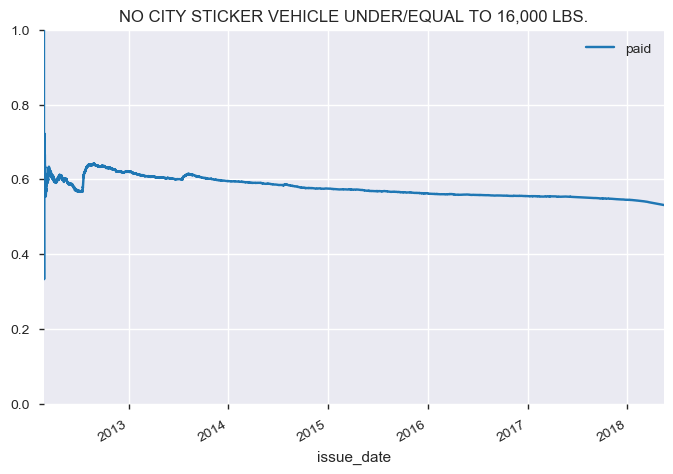

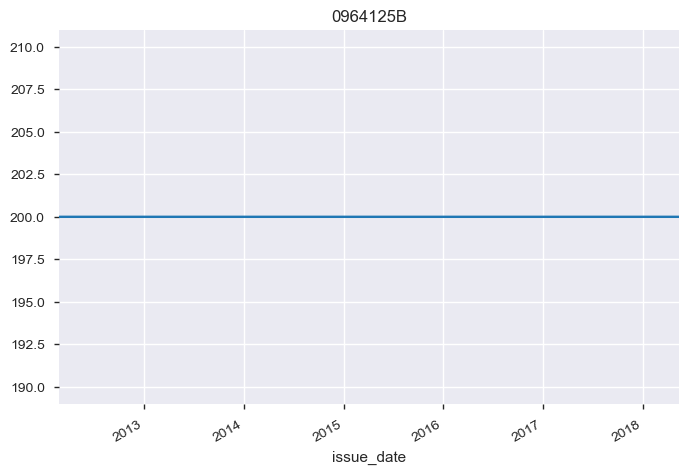

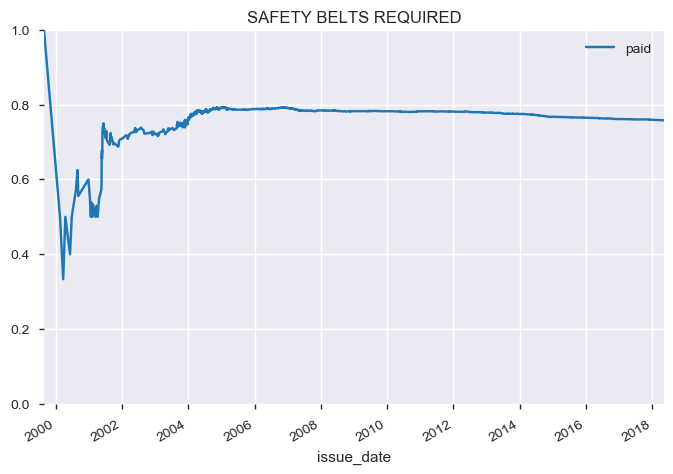

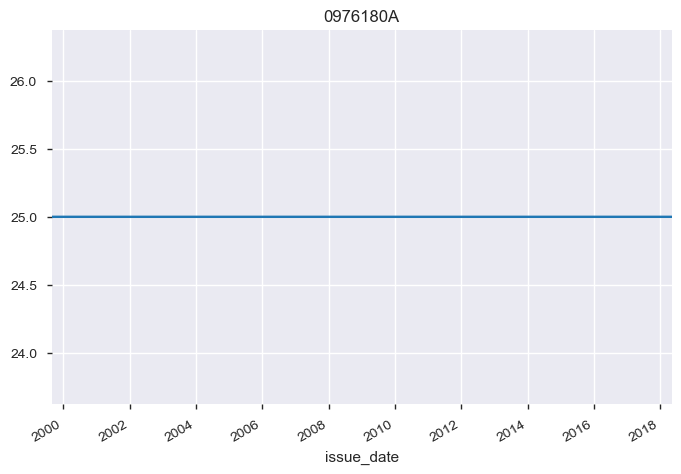

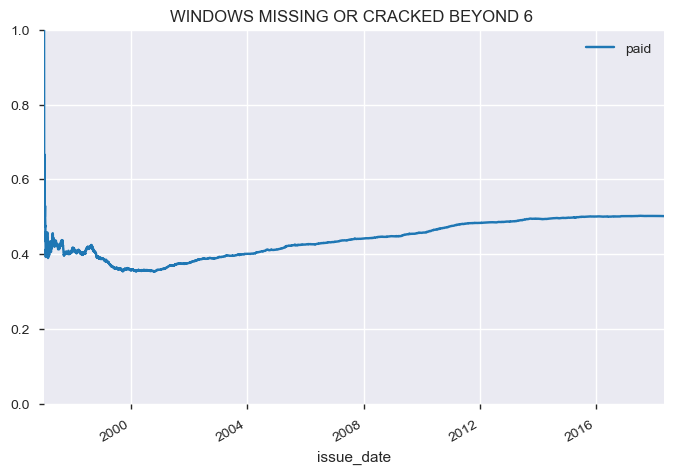

...

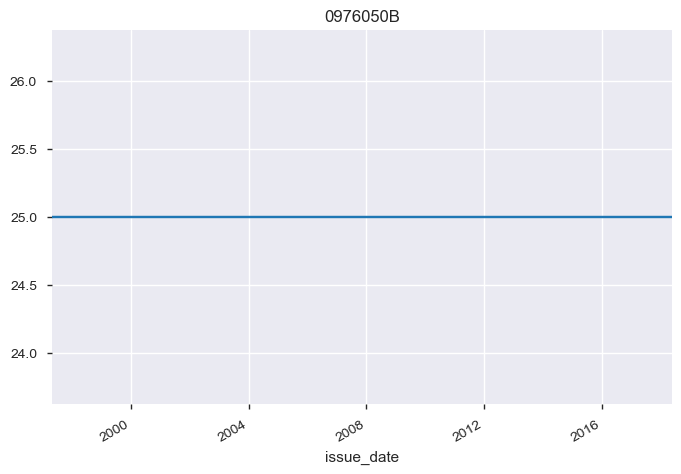

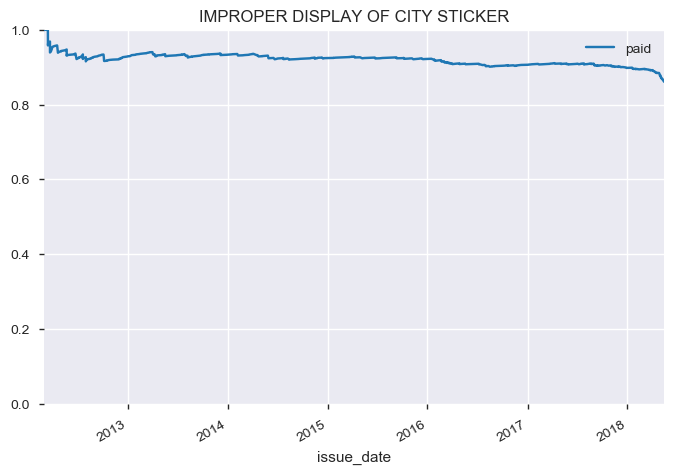

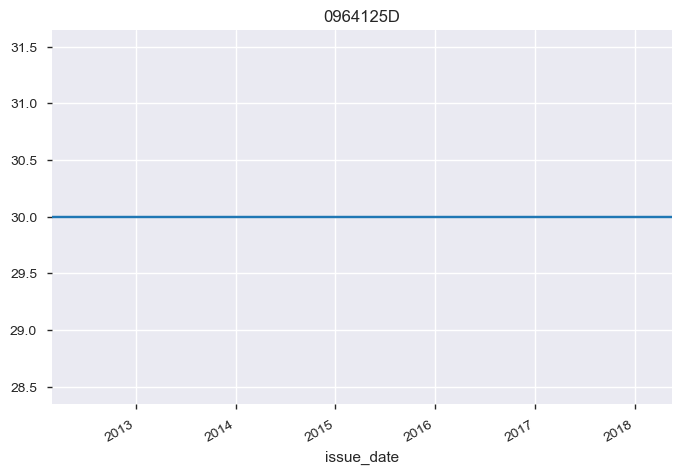

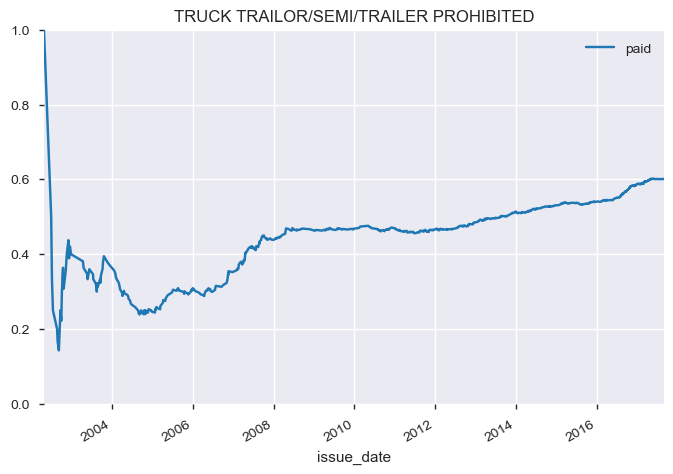

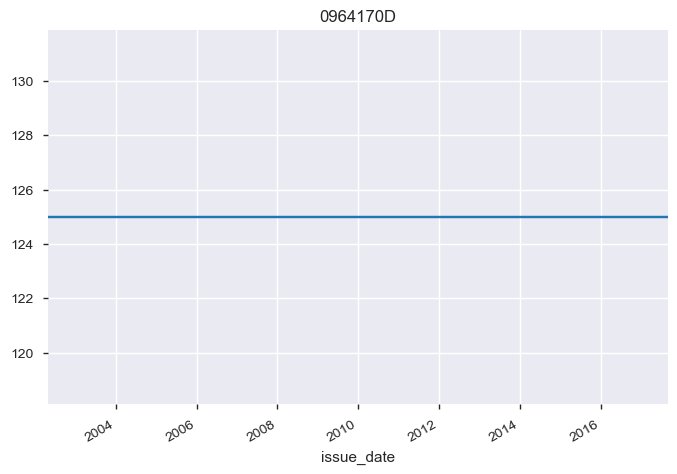

In [515]:
for code in constant:
    length = test[test['violation_code'].isin([code])].shape[0]
    pd.DataFrame(test[test['violation_code'].isin([code])]['paid'].cumsum()/np.arange(1, length+1)).plot()
    plt.title(parking[parking['violation_code'] == code].violation_description.iloc[0])
    plt.ylim(0, 1)
    plt.show()
    
    parking[parking['violation_code'] == code].set_index('issue_date')['fine_level1_amount'].plot()
    plt.title(code)
    plt.show()

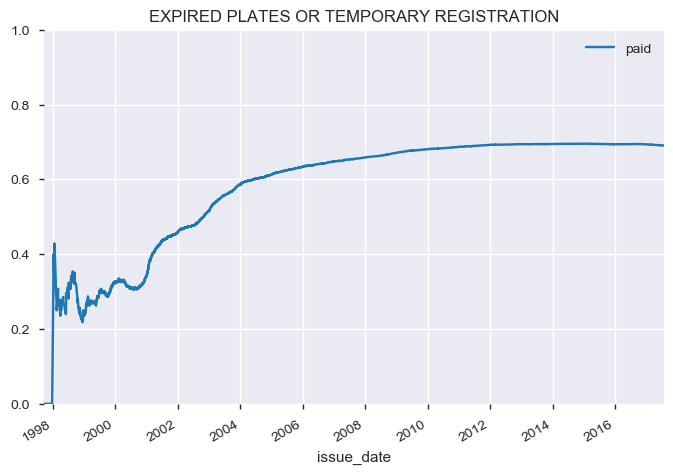

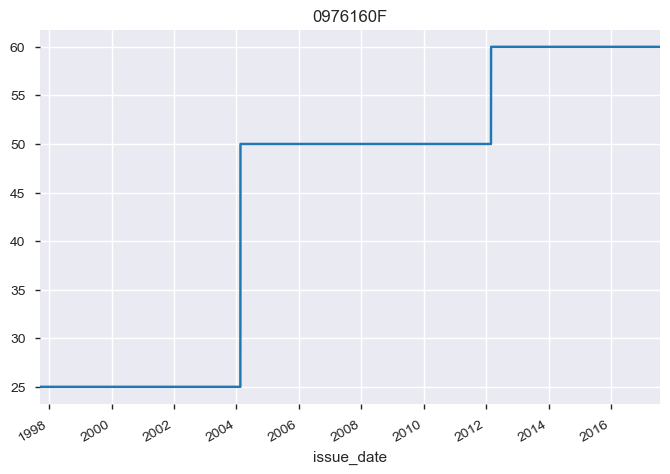

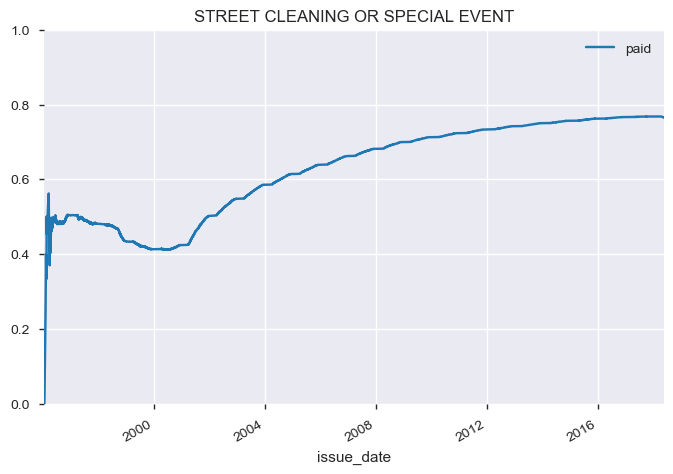

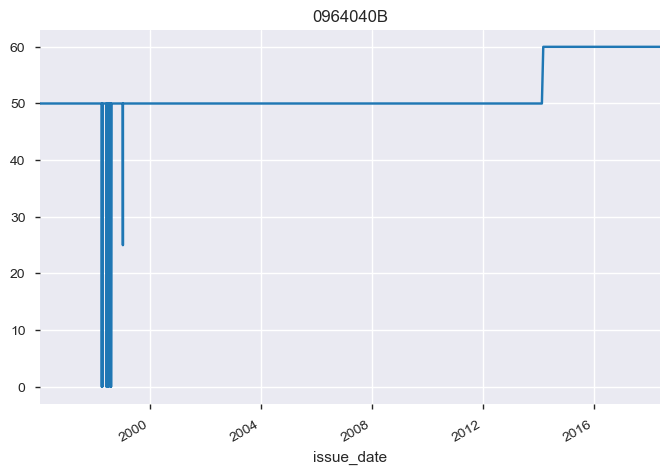

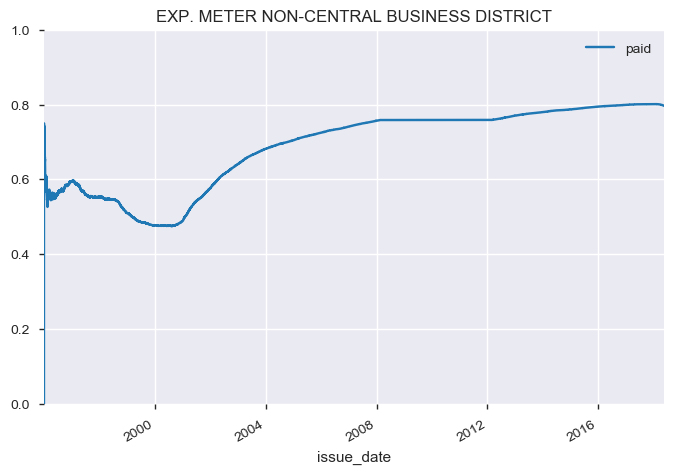

...

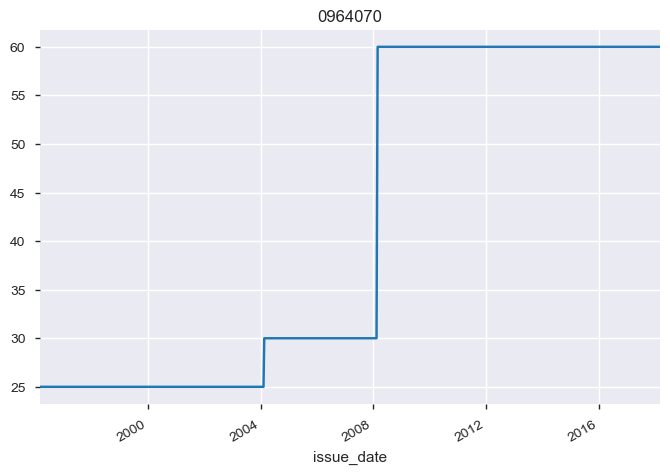

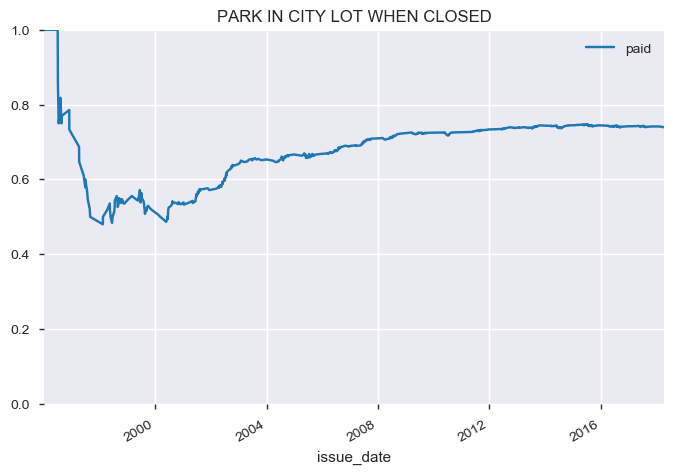

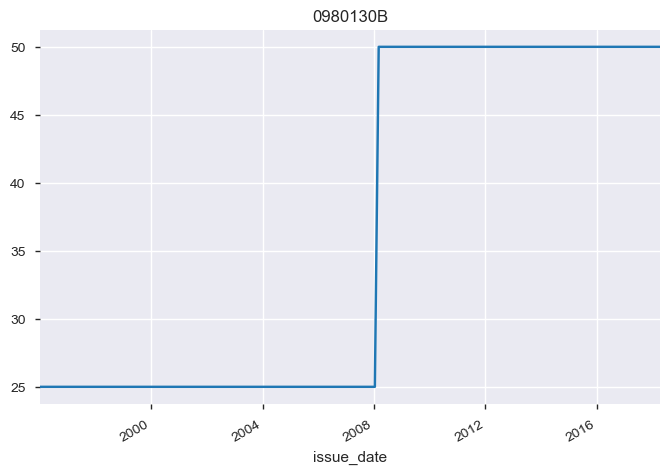

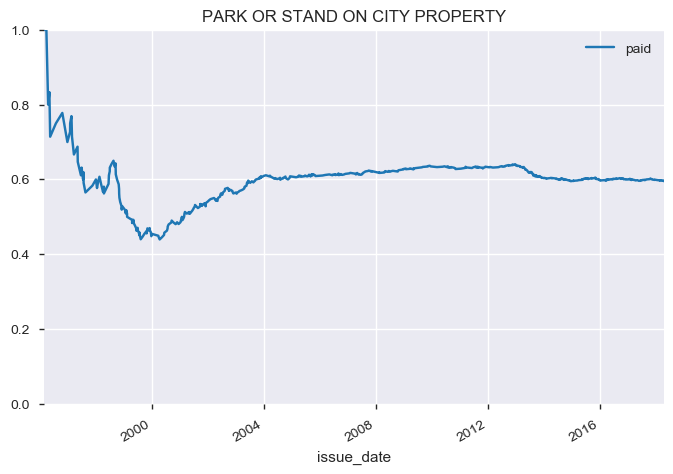

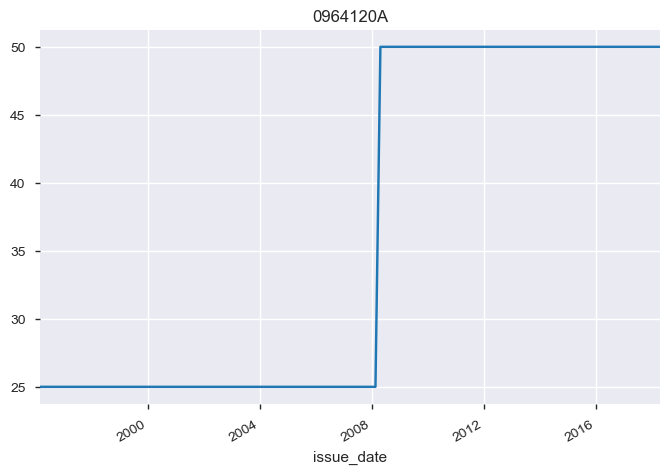

In [519]:
for code in changing:
    length = test[test['violation_code'].isin([code])].shape[0]
#    plt.subplot(121)
    pd.DataFrame(test[test['violation_code'].isin([code])]['paid'].cumsum()/np.arange(1, length+1)).plot()
    plt.title(parking[parking['violation_code'] == code].violation_description.iloc[0])
    plt.ylim(0, 1)
    plt.show()

#    plt.subplot(122)
    parking[parking['violation_code'] == code].set_index('issue_date')['fine_level1_amount'].plot()
    plt.title(code)
    plt.show()

In [484]:
key = parking[['violation_code', 'violation_description']].groupby(['violation_code', 'violation_description']).head(1).set_index('violation_code')

In [417]:
tues4pm.groupby('violation_code').count().iloc[:, :1].sort_values(by='ticket_number', ascending=False).head(60).index

Index(['0976160F', '0964040B', '0964190A', '0964150B', '0964125', '0964090E',
       '0976160A', '0964080A', '0964190B', '0964190', '0964140B', '0964080B',
       '0964125B', '0964100A', '0964090B', '0964170A', '0964110A', '0964130',
       '0964110C', '0964020B', '0976160B', '0964100G', '0976220B', '0980110A',
       '0964160B', '0976160D', '0964050J', '0964100C', '0964110D', '0964060',
       '0976180A', '0976210B', '0964020A', '0980080A', '0964100D', '0964130A',
       '0980110B', '0912060', '0976160', '0964200B', '0964050I', '0964110E',
       '0964170B', '0980120B', '0964110G', '0964100F', '0976220A', '0980130A',
       '0976050B', '0964100B', '0964125D', '0964180A', '0964070', '0964170D',
       '0964050C', '0980130B', '0964160A', '0964120A', '0976160E', '0724225'],
      dtype='object', name='violation_code')

In [361]:
parking[parking['violation_description'].isin(['NO CITY STICKER OR IMPROPER DISPLAY', 'NO CITY STICKER VEHICLE UNDER/EQUAL TO 16,000 LBS.'])].set_index('issue_date').sort_values('issue_date')['paid'].cumsum()

issue_date
1996-01-01 09:44:00        0
1996-01-01 15:28:00        0
1996-01-02 12:35:00        0
1996-01-02 15:36:00        1
1996-01-03 03:11:00        2
                       ...  
2018-05-11 15:07:00    62111
2018-05-13 08:16:00    62111
2018-05-13 08:34:00    62111
2018-05-14 13:38:00    62111
2018-05-14 16:25:00    62111
Name: paid, Length: 110998, dtype: int32

In [362]:
parking.set_index('parking[parking['violation_description'].isin(['NO CITY STICKER OR IMPROPER DISPLAY', 'NO CITY STICKER VEHICLE UNDER/EQUAL TO 16,000 LBS.'])].set_index('issue_date').sort_values('issue_date')['fine_level1_amount'] == 0

issue_date
1996-01-01 09:44:00    False
1996-01-01 15:28:00    False
1996-01-02 12:35:00    False
1996-01-02 15:36:00    False
1996-01-03 03:11:00    False
                       ...  
2018-05-11 15:07:00    False
2018-05-13 08:16:00    False
2018-05-13 08:34:00    False
2018-05-14 13:38:00    False
2018-05-14 16:25:00    False
Name: fine_level1_amount, Length: 110998, dtype: bool

In [300]:
tues2pm.sort_values('issue_date', inplace=True)

In [310]:
test = tues2pm.set_index('issue_date').paid * 1

In [315]:
test

issue_date
1996-01-01 03:25:00    0
1996-01-01 03:28:00    0
1996-01-01 06:05:00    0
1996-01-01 07:00:00    0
1996-01-01 07:45:00    0
                      ..
2018-05-14 20:34:00    0
2018-05-14 20:51:00    0
2018-05-14 21:00:00    0
2018-05-14 21:38:00    0
NaT                    0
Name: paid, Length: 1088611, dtype: int32

In [321]:
data_A = test

In [322]:
def plot_with_fill(ax, x, y, label):
    lines = ax.plot(x, y, label=label, lw=2)
    ax.fill_between(x, 0, y, alpha=0.2, color=lines[0].get_c())

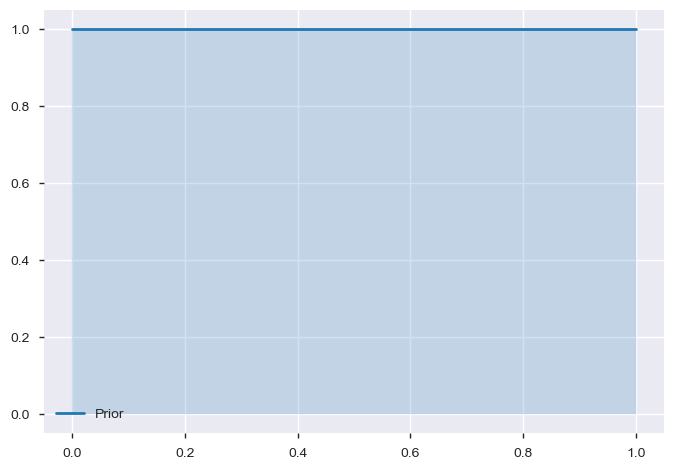

In [323]:
x = np.arange(0, 1.01, 0.01)
y = stats.uniform(0, 1).pdf(x)

ax = plt.subplot(1, 1, 1)
plot_with_fill(ax=ax, x=x, y=y, label='Prior')
ax.legend()
plt.show()

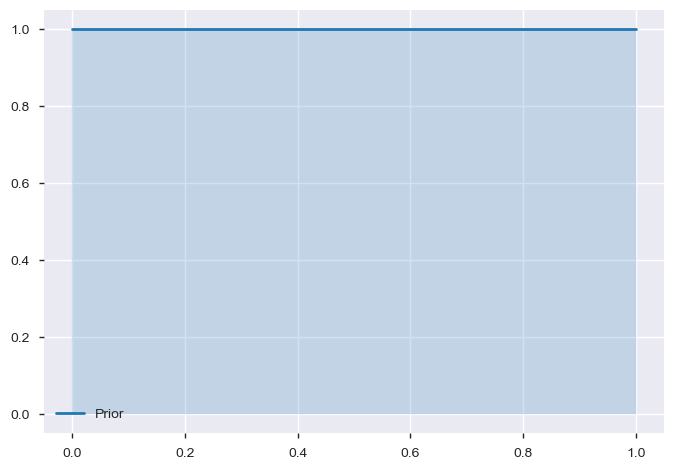

In [324]:
x = np.arange(0, 1.01, 0.01)
alpha = 1
beta = 1
y = stats.beta(a=alpha, b=beta).pdf(x)

ax = plt.subplot(1, 1, 1)
plot_with_fill(ax=ax, x=x, y=y, label='Prior')
ax.legend()
plt.show()

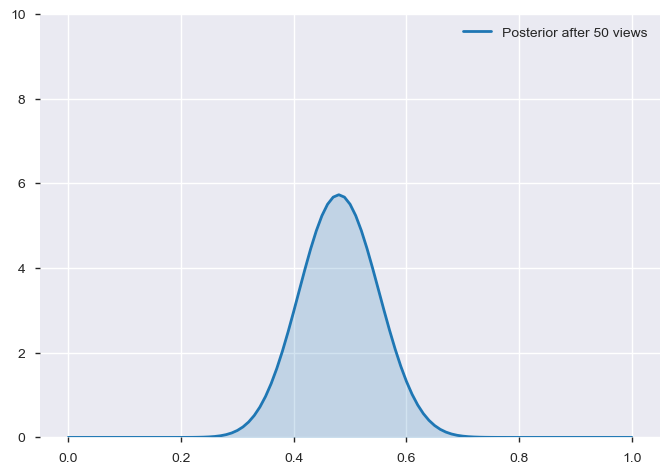

In [325]:
x = np.arange(0, 1.01, 0.01)
alpha = 1
beta = 1

conversions = sum(data_A[:50])
non_conversions = len(data_A[:50]) - sum(data_A[:50])
y = stats.beta(a=alpha + conversions, b=beta + non_conversions).pdf(x)

ax = plt.subplot(1, 1, 1)
plot_with_fill(ax=ax, x=x, y=y, label='Posterior after 50 views')
ax.set_ylim(0, 10)
ax.legend()
plt.show()

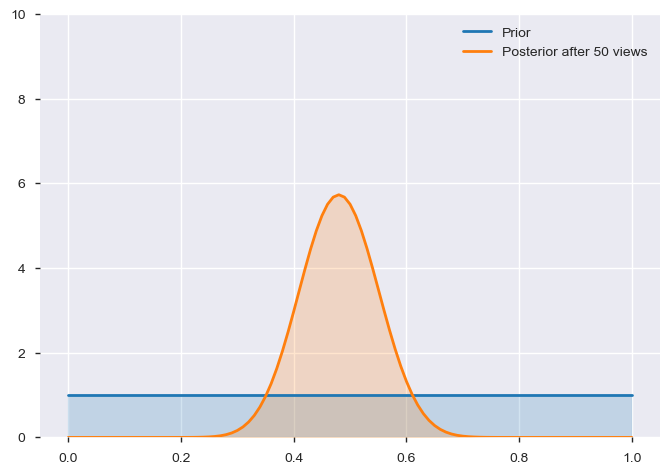

In [327]:
x = np.arange(0, 1.01, 0.01)
alpha = 1
beta = 1
y = stats.beta(a=alpha, b=beta).pdf(x)

conversions = sum(data_A[:50])
non_conversions = len(data_A[:50]) - sum(data_A[:50])
y1 = stats.beta(a=alpha + conversions, b=beta + non_conversions).pdf(x)

ax = plt.subplot(1, 1, 1)
plot_with_fill(ax=ax, x=x, y=y, label='Prior')
plot_with_fill(ax=ax, x=x, y=y1, label='Posterior after 50 views')
ax.set_ylim(0, 10)
ax.legend()
plt.show()

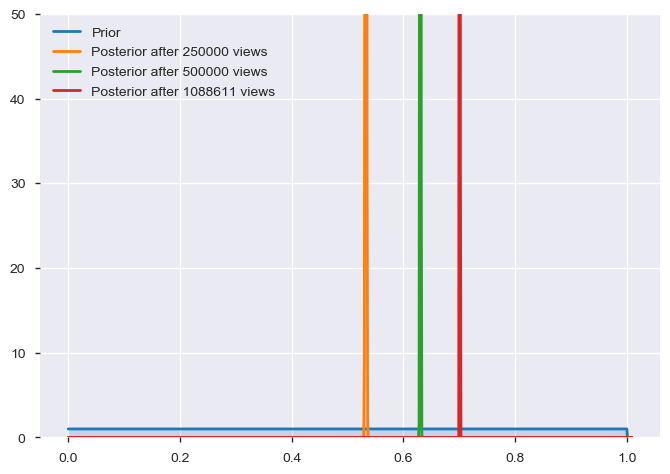

In [332]:
x = np.arange(0, 1.01, 0.001)
alpha = 1
beta = 1
y = stats.beta(a=alpha, b=beta).pdf(x)

views = [50, 100, 200, 400, 800]
views = [250000, 500000, len(data_A)]

ax = plt.subplot(1, 1, 1)
plot_with_fill(ax=ax, x=x, y=y, label='Prior')

for view in views:
    conversions = sum(data_A[:view])
    non_conversions = len(data_A[:view]) - sum(data_A[:view])
    y1 = stats.beta(a=alpha + conversions, b=beta + non_conversions).pdf(x)

    plot_with_fill(ax=ax, x=x, y=y1, label=f'Posterior after {view} views')

#ax.set_xlim(0, 0.25)
ax.set_ylim(0, 50)
ax.legend()
plt.show()

In [335]:
views = [len(data_A)]
size = 10000

conversions_A = sum(data_A[:view])
non_conversions_A = len(data_A[:view]) - sum(data_A[:view])

A = np.random.beta(a=1+conversions_A, b=1+non_conversions_A, size=size)

In [336]:
print('The 95% equal-tailed interval for site A\'s click-through-rate is:', stats.beta(a=1+conversions_A, b=1+non_conversions_A).ppf([0.025, 0.975]))

The 95% equal-tailed interval for site A's click-through-rate is: [0.70000751 0.70172776]


In [339]:
pd.DataFrame(data_A)

,paid
issue_date,
1996-01-01 03:25:00,0
1996-01-01 03:28:00,0
1996-01-01 06:05:00,0
1996-01-01 07:00:00,0
1996-01-01 07:45:00,0
...,...
2018-05-14 20:34:00,0
2018-05-14 20:51:00,0
2018-05-14 21:00:00,0


0

In [106]:
import matplotlib.pyplot as plt
%matplotlib inline

In [203]:
chi = parking[parking['zipcode_5_dig'].isin([str(code) for code in zipcodes])]

In [201]:
zipcodes = [46320,
46327,
60007,
60018,
60068,
60076,
60077,
60106,
60131,
60171,
60176,
60202,
60302,
60304,
60305,
60402,
60406,
60409,
60419,
60453,
60456,
60459,
60501,
60601,
60602,
60603,
60604,
60605,
60606,
60607,
60608,
60609,
60610,
60611,
60612,
60613,
60614,
60615,
60616,
60617,
60618,
60619,
60620,
60621,
60622,
60623,
60624,
60625,
60626,
60628,
60629,
60630,
60631,
60632,
60633,
60634,
60636,
60637,
60638,
60639,
60640,
60641,
60642,
60643,
60644,
60645,
60646,
60647,
60649,
60651,
60652,
60653,
60654,
60655,
60656,
60657,
60659,
60660,
60661,
60706,
60707,
60712,
60714,
60803,
60804,
60805,
60827]

In [204]:
pandas_profiling.ProfileReport(chi)

C:\Users\K\Anaconda3\lib\site-packages\pandas_profiling\describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,38
Number of observations,546080
Total Missing (%),3.4%
Total size in memory,158.3 MiB
Average record size in memory,304.0 B
Numeric,10
Categorical,24
Boolean,0
Date,2
Text (Unique),1
Rejected,1


In [151]:
parking.zipcode_5_dig.value_counts()

00000    66966
60647    22000
60618    20490
60639    19277
60623    18479
         ...  
14069        1
92620        1
06470        1
18434        1
49344        1
Name: zipcode_5_dig, Length: 8692, dtype: int64

In [74]:
# Don't touch license_plate_numbers. Just exclude weird values from plotting.
# invalid = ['c94d83c96b6835504fd7f59088b12a1953730dd882eac0dc089b1d1d250abf1b',
#           '21821a595e6c51a69ed3e6f17ec4a9dac9bf1e7300edbedbe2fb3df207414c0f',
#           '9a366ff551e6790a63d166fc0148285855fa5e1cd8c9255d8d2aa7b99eb0d808']
# for plate in invalid:
#     parking.loc[parking['license_plate_number'] == plate, 'license_plate_number'] = np.NaN


In [75]:
parking[parking['license_plate_number'] == 'cb3d77e5ceb26c1699b4dfe2f88ac5e8866de1eb2cb55358154ee3a89a19823b'].iloc[:,10:]

,unit_description,vehicle_make,fine_level1_amount,fine_level2_amount,current_amount_due,total_payments,ticket_queue,ticket_queue_date,notice_level,notice_number,...,tract_id,blockgroup_geoid,community_area_number,community_area_name,geocode_accuracy,geocode_accuracy_type,geocoded_address,geocoded_lng,geocoded_lat,zipcode_5_dig
76599,DOF,TOYT,65,130,0.0,0.0,Dismissed,2018-04-02,NaN,0,...,841900.0,170318419002.0,28.0,NEAR WEST SIDE,1.00,range_interpolation,"1100 S Canal St, Chicago, IL 60606",-87.639386,41.868487,NaN
251123,DOF,BMW,150,300,0.0,0.0,Dismissed,2016-10-14,NaN,0,...,nan,nan,nan,NaN,1.00,place,"Chicago, IL 60601",-87.622130,41.885310,NaN
252286,DOF,FERR,50,100,0.0,0.0,Dismissed,2017-07-17,NaN,0,...,nan,nan,nan,NaN,1.00,place,"Chicago, IL 60601",-87.622130,41.885310,NaN
408991,DOF,ACUR,75,150,0.0,0.0,Dismissed,2015-11-04,NaN,0,...,nan,nan,nan,NaN,1.00,place,"Chicago, IL 60601",-87.622130,41.885310,NaN
410419,DOF,ACUR,75,150,0.0,0.0,Dismissed,2018-01-02,NaN,0,...,nan,nan,nan,NaN,1.00,place,"Chicago, IL 60601",-87.622130,41.885310,NaN
434360,DOF,ACUR,75,150,0.0,0.0,Dismissed,2015-01-02,NaN,0,...,310200.0,170313102001.0,31.0,LOWER WEST SIDE,1.00,rooftop,"600 W Cermak Rd, Chicago, IL 60616",-87.642846,41.853308,NaN
434668,DOF,ACUR,75,150,0.0,0.0,Dismissed,2015-01-16,NaN,0,...,310200.0,170313102001.0,31.0,LOWER WEST SIDE,1.00,rooftop,"600 W Cermak Rd, Chicago, IL 60616",-87.642846,41.853308,NaN
434908,DOF,ACUR,75,150,0.0,0.0,Dismissed,2015-01-26,NaN,0,...,310200.0,170313102001.0,31.0,LOWER WEST SIDE,1.00,rooftop,"600 W Cermak Rd, Chicago, IL 60616",-87.642846,41.853308,NaN
435019,DOF,ACUR,75,150,0.0,0.0,Dismissed,2016-01-05,NaN,0,...,310200.0,170313102001.0,31.0,LOWER WEST SIDE,1.00,rooftop,"600 W Cermak Rd, Chicago, IL 60616",-87.642846,41.853308,NaN
435867,DOF,ACUR,75,150,0.0,0.0,Dismissed,2015-03-05,NaN,0,...,310200.0,170313102001.0,31.0,LOWER WEST SIDE,1.00,rooftop,"600 W Cermak Rd, Chicago, IL 60616",-87.642846,41.853308,NaN


In [63]:
parking.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1088610 entries, 0 to 1088609
Data columns (total 37 columns):
ticket_number            1088610 non-null object
issue_date               1088610 non-null datetime64[ns]
violation_location       1088610 non-null object
license_plate_number     1088610 non-null object
license_plate_state      1075195 non-null object
license_plate_type       1070720 non-null object
zipcode                  932109 non-null object
violation_code           1088610 non-null object
violation_description    1088610 non-null object
unit                     1019861 non-null object
unit_description         1088610 non-null object
vehicle_make             1088610 non-null object
fine_level1_amount       1088610 non-null int64
fine_level2_amount       1088610 non-null int64
current_amount_due       1088610 non-null float64
total_payments           1088610 non-null float64
ticket_queue             1088610 non-null object
ticket_queue_date        1088610 non-null datet

In [78]:
parking.loc[:, ['issue_date', 'violation_description', 'fine_level1_amount']].groupby('violation_description').count().sort_values('issue_date', ascending=False)[:19].index

Index(['EXPIRED PLATES OR TEMPORARY REGISTRATION',
       'EXP. METER NON-CENTRAL BUSINESS DISTRICT',
       'PARKING/STANDING PROHIBITED ANYTIME',
       'NO CITY STICKER OR IMPROPER DISPLAY', 'RESIDENTIAL PERMIT PARKING',
       'RUSH HOUR PARKING', 'STREET CLEANING OR SPECIAL EVENT',
       'REAR AND FRONT PLATE REQUIRED', 'STREET CLEANING',
       'EXPIRED METER CENTRAL BUSINESS DISTRICT', 'EXPIRED METER OR OVERSTAY',
       'PARK OR STAND IN BUS/TAXI/CARRIAGE STAND',
       'NO STANDING/PARKING TIME RESTRICTED',
       'NO CITY STICKER VEHICLE UNDER/EQUAL TO 16,000 LBS.',
       'WITHIN 15' OF FIRE HYDRANT', 'RESIDENTIAL PARKING PERMIT ZONE',
       'TRUCK,RV,BUS, OR TAXI RESIDENTIAL STREET', 'PARK OR BLOCK ALLEY',
       'DOUBLE PARKING OR STANDING'],
      dtype='object', name='violation_description')

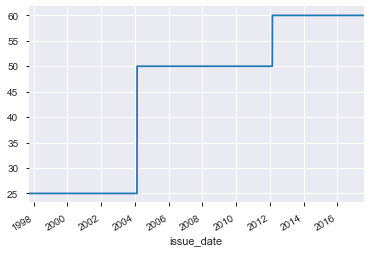

In [76]:
parking[parking['violation_description'] == 'EXPIRED PLATES OR TEMPORARY REGISTRATION'].set_index(keys='issue_date').loc[:,'fine_level1_amount'].plot()

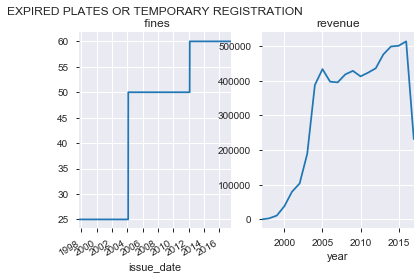

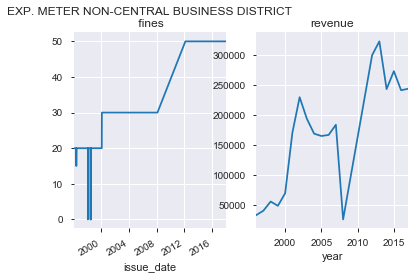

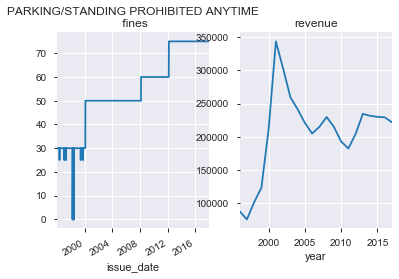

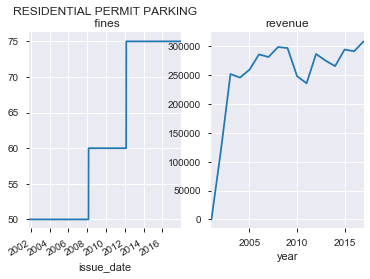

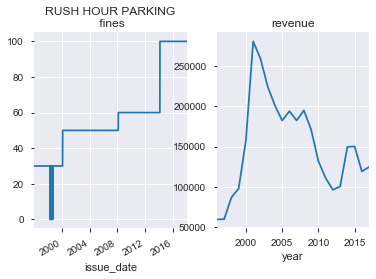

...

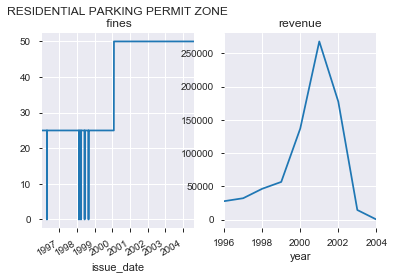

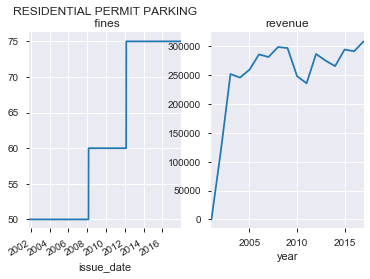

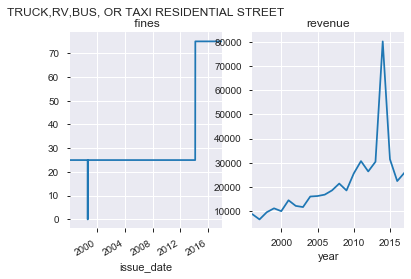

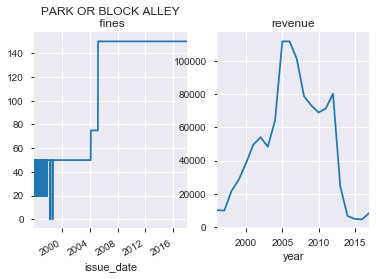

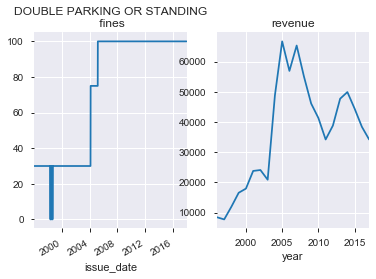

In [99]:
Index = ['EXPIRED PLATES OR TEMPORARY REGISTRATION',
       'EXP. METER NON-CENTRAL BUSINESS DISTRICT',
       'PARKING/STANDING PROHIBITED ANYTIME',
       'RESIDENTIAL PERMIT PARKING',
       'RUSH HOUR PARKING', 
       'REAR AND FRONT PLATE REQUIRED', 'STREET CLEANING',
       'EXPIRED METER CENTRAL BUSINESS DISTRICT', 
       'PARK OR STAND IN BUS/TAXI/CARRIAGE STAND',
       'NO STANDING/PARKING TIME RESTRICTED',
       'NO CITY STICKER OR IMPROPER DISPLAY', 'NO CITY STICKER VEHICLE UNDER/EQUAL TO 16,000 LBS.',
       "WITHIN 15' OF FIRE HYDRANT", 'RESIDENTIAL PARKING PERMIT ZONE', 'RESIDENTIAL PERMIT PARKING',
       'TRUCK,RV,BUS, OR TAXI RESIDENTIAL STREET', 'PARK OR BLOCK ALLEY',
       'DOUBLE PARKING OR STANDING']
for value in Index:
    plt.subplot(121)
    parking[(parking['violation_description'] == value) & (parking['year']!=2018)].set_index(keys='issue_date').loc[:,'fine_level1_amount'].plot()
    plt.title(f'{value}\n fines')
    plt.subplot(122)
    parking[(parking['violation_description'] == value) & (parking['year']!=2018)].groupby('year')['fine_level1_amount'].sum().plot()
    plt.title(f'revenue')
    plt.show()

In [94]:
parking['violation_description'] == value parking['year']!=2018

TypeError: cannot compare a dtyped [int64] array with a scalar of type [bool]

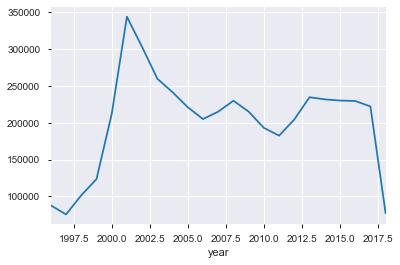

In [84]:
for value in Index
